In [7]:
import cv2
import matplotlib.pyplot as plt
import os, glob

In [2]:
print(cv2.__version__)

4.5.2


In [3]:
def sorted_list(path):
    
    tmplist = glob.glob(path)
    tmplist.sort()
    
    return tmplist

In [4]:
#path = '/home/kyj1103/darkflow/sample_img'
path = '/data/open_dt/bdd_dataset/bdd100k/images/10k/test/'
#path = '/home/kyj1103/tttt'

In [5]:
list_data = sorted_list(os.path.join(path,'*'))

In [6]:
list_data

['/data/open_dt/bdd_dataset/bdd100k/images/10k/test/ac517380-00000000.jpg',
 '/data/open_dt/bdd_dataset/bdd100k/images/10k/test/ac56c836-bdabca21.jpg',
 '/data/open_dt/bdd_dataset/bdd100k/images/10k/test/ac6d4f42-00000000.jpg',
 '/data/open_dt/bdd_dataset/bdd100k/images/10k/test/ac6e638d-7c84846d.jpg',
 '/data/open_dt/bdd_dataset/bdd100k/images/10k/test/ac73d367-0cb39ad0.jpg',
 '/data/open_dt/bdd_dataset/bdd100k/images/10k/test/ac985232-00000000.jpg',
 '/data/open_dt/bdd_dataset/bdd100k/images/10k/test/ac9be3fe-790d1f8e.jpg',
 '/data/open_dt/bdd_dataset/bdd100k/images/10k/test/aca32929-00000000.jpg',
 '/data/open_dt/bdd_dataset/bdd100k/images/10k/test/aca4b150-00000000.jpg',
 '/data/open_dt/bdd_dataset/bdd100k/images/10k/test/acaaf824-00000000.jpg',
 '/data/open_dt/bdd_dataset/bdd100k/images/10k/test/ace9bf57-669189d2.jpg',
 '/data/open_dt/bdd_dataset/bdd100k/images/10k/test/ad522266-1f8f3ba4.jpg',
 '/data/open_dt/bdd_dataset/bdd100k/images/10k/test/ad9f7908-42ec4c0e.jpg',
 '/data/open

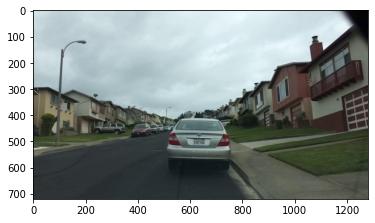

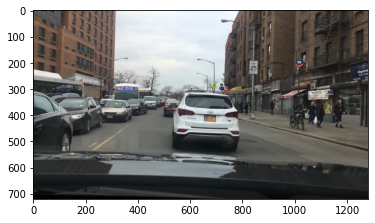

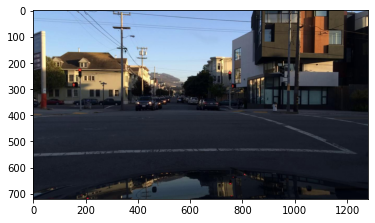

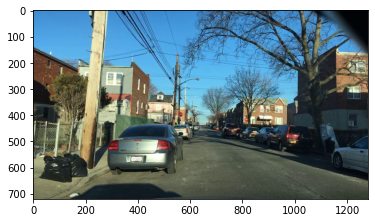

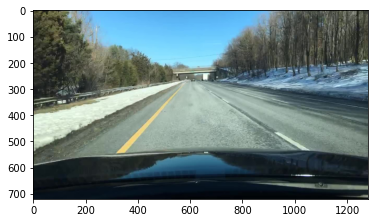

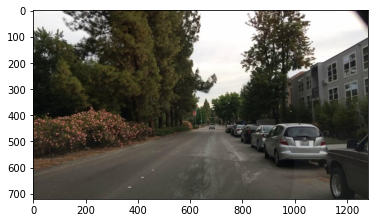

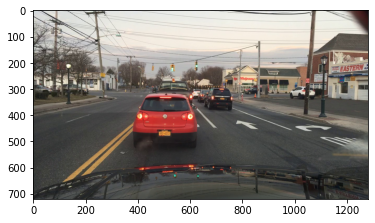

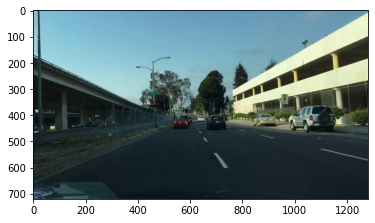

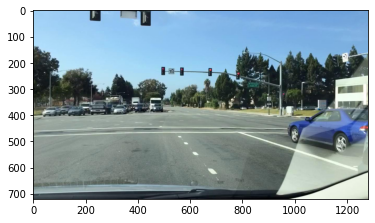

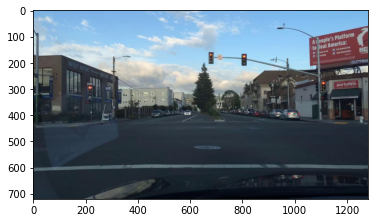

In [22]:
for i in list_data[:10]:
    img = cv2.imread(i)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

### <dnn.detectionModel>

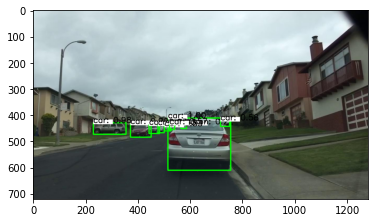

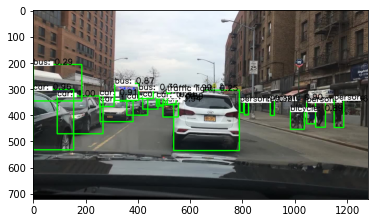

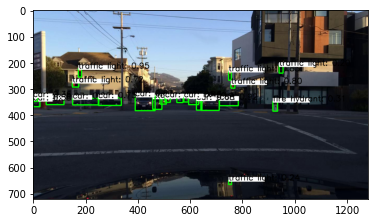

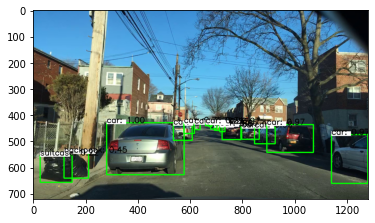

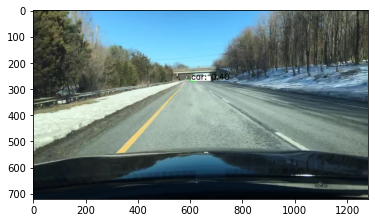

...

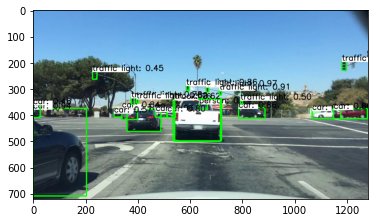

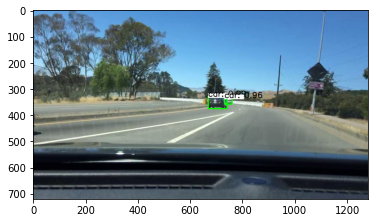

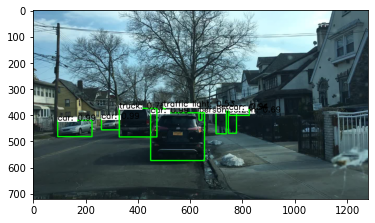

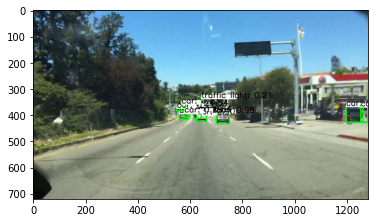

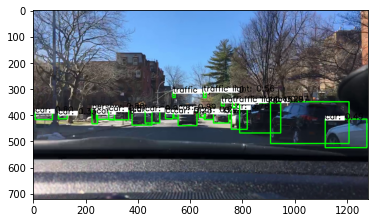

In [9]:
for i in list_data[:40]:
    img = cv2.imread(i)
    
    net = cv2.dnn_DetectionModel('yolov4.weights', 'yolov4.cfg')
    net.setInputSize(704,704)
    net.setInputScale(1.0 / 255)
    net.setInputSwapRB(True)

    frame = cv2.imread(i)
    
    with open("coco.names", "rt") as f:
        names = f.read().rstrip('\n').split('\n')
    classes, confidences,boxes = net.detect(frame,confThreshold=0.1, nmsThreshold=0.4)
    
    
    
    if len(classes) > 0:
        for classId,confidence,box in zip(classes.flatten(), confidences.flatten(), boxes):
            label = '%.2f' % confidence
            label = '%s: %s' % (names[classId], label)
            labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5,1)
            left, top, width, height = box
            top = max(top,labelSize[1])
            cv2.rectangle(frame,box,color=(0,255,0),thickness=3)
            cv2.rectangle(frame, (left,top - labelSize[1]), (left+labelSize[0], top+baseLine), (255,255,255), cv2.FILLED)
            cv2.putText(frame,label, (left,top), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,0),thickness=2)
    
    
    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))    
    plt.show() 

##### 코드합체

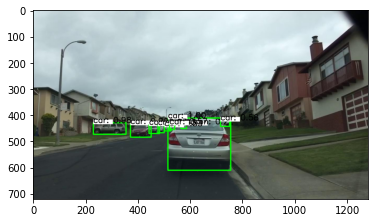

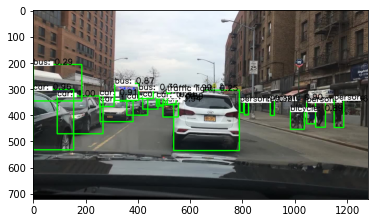

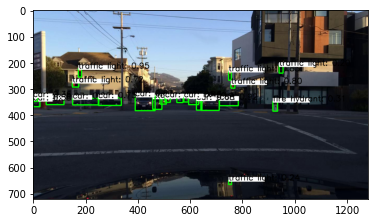

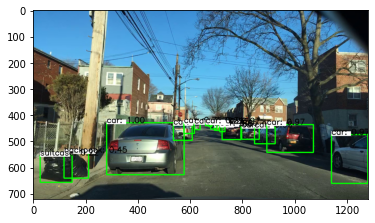

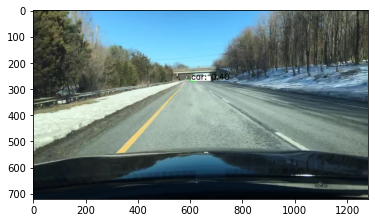

...

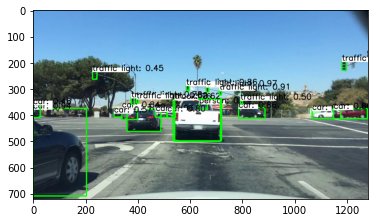

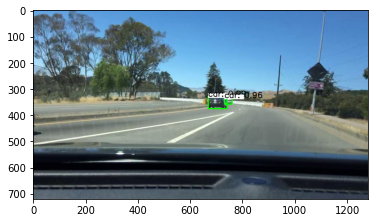

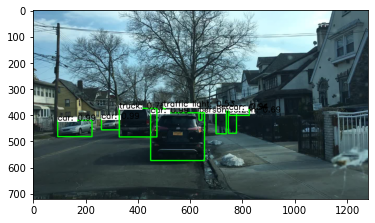

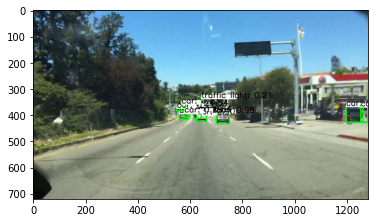

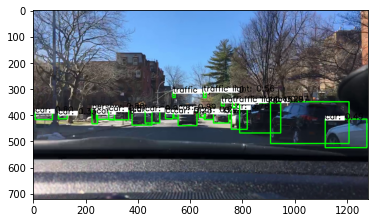

In [23]:
for i in list_data[:40]:
    img = cv2.imread(i)
    
    net = cv2.dnn_DetectionModel('yolov4.weights', 'yolov4.cfg')
    net.setInputSize(704,704)
    net.setInputScale(1.0 / 255)
    net.setInputSwapRB(True)

    frame = cv2.imread(i)
    
    with open("coco.names", "rt") as f:
        names = f.read().rstrip('\n').split('\n')
    classes, confidences,boxes = net.detect(frame,confThreshold=0.1, nmsThreshold=0.4)
    
    
    
    if len(classes) > 0:
        for classId,confidence,box in zip(classes.flatten(), confidences.flatten(), boxes):
            label = '%.2f' % confidence
            label = '%s: %s' % (names[classId], label)
            labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5,1)
            left, top, width, height = box
            top = max(top,labelSize[1])
            cv2.rectangle(frame,box,color=(0,255,0),thickness=3)
            cv2.rectangle(frame, (left,top - labelSize[1]), (left+labelSize[0], top+baseLine), (255,255,255), cv2.FILLED)
            cv2.putText(frame,label, (left,top), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,0),thickness=2)
    
    
    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))    
    plt.show()      

In [26]:
boxes

array([[ 225,  376,   22,   58],
       [ 689,  392,   60,   39],
       [ 378,  387,   77,   52],
       [ 907,  349,  301,  160],
       [ 428,  384,   57,   47],
       [ 654,  391,   36,   27],
       [ 554,  379,   73,   62],
       [   8,  389,   67,   29],
       [ 757,  375,   62,   80],
       [ 789,  354,  158,  115],
       [ 242,  393,   70,   24],
       [ 289,  383,   77,   36],
       [ 506,  391,   29,   24],
       [1116,  415,  160,  110],
       [  96,  396,   35,   19],
       [ 636,  388,   23,   22],
       [ 538,  392,   17,   20],
       [ 534,  313,   10,   21],
       [ 651,  309,   11,   25],
       [ 719,  350,   12,   16],
       [ 762,  349,   13,   24]], dtype=int32)

### gpu 사용가능 확인

In [5]:
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 5225861676521460507,
 name: "/device:XLA_CPU:0"
 device_type: "XLA_CPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 1418336472458429156
 physical_device_desc: "device: XLA_CPU device",
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 23703186304
 locality {
   bus_id: 1
   links {
     link {
       device_id: 1
       type: "StreamExecutor"
       strength: 1
     }
   }
 }
 incarnation: 13632555258103384348
 physical_device_desc: "device: 0, name: TITAN RTX, pci bus id: 0000:17:00.0, compute capability: 7.5",
 name: "/device:GPU:1"
 device_type: "GPU"
 memory_limit: 23703186304
 locality {
   bus_id: 1
   links {
     link {
       type: "StreamExecutor"
       strength: 1
     }
   }
 }
 incarnation: 11328047738048299534
 physical_device_desc: "device: 1, name: TITAN RTX, pci bus id: 0000:65:00.0, compute capability: 7.5",
 name: "/device:XLA_GPU:0"
 device_type: "XL

In [2]:
import tensorflow as tf

In [3]:
tf.test.is_gpu_available()

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


True

### 동영상적용

In [2]:
import cv2
import time
import ipywidgets as widgets 
import IPython.display as display

In [3]:
CONFIDENCE_THRESHOLD = 0.2
NMS_THRESHOLD = 0.4
COLORS = [(0, 255, 255), (255, 255, 0), (0, 255, 0), (255, 0, 0)]

In [4]:
class_names = []
with open("coco.names", "r") as f:
    class_names = [cname.strip() for cname in f.readlines()]

In [5]:
net = cv2.dnn.readNet("yolov4.weights", "yolov4.cfg")
net.setPreferableBackend(cv2.dnn.DNN_BACKEND_CUDA)
net.setPreferableTarget(cv2.dnn.DNN_TARGET_CUDA_FP16)

In [6]:
model = cv2.dnn_DetectionModel(net)
model.setInputParams(size=(416, 416), scale=1/255, swapRB=True)

In [7]:
path = '/data/open_dt'
#cap = cv2.VideoCapture(path+'/sejong_drive.mp4')
cap = cv2.VideoCapture(path+'/pedestrian10.mp4') 

frame_size = (int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)),int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)))
print('frame_size=',frame_size)

width, height = frame_size

frame_size= (1920, 1080)


In [8]:
while cv2.waitKey(1) < 1:
    ret, frame = cap.read()
    if not ret:
        break
        

    start = time.time()
    classes, scores, boxes = model.detect(frame, CONFIDENCE_THRESHOLD, NMS_THRESHOLD)
    end = time.time()

    start_drawing = time.time()
    for (classid, score, box) in zip(classes, scores, boxes):
        color = COLORS[int(classid) % len(COLORS)]
        label = "%s : %f" % (class_names[classid[0]], score)
        cv2.rectangle(frame, box, color, 2)
        cv2.putText(frame, label, (box[0], box[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
        
        
        # 블러처리
        left, top, width, height = box
        roi = frame[top:top+height, left:left+width]   # 관심영역 지정
        roi = cv2.GaussianBlur(roi,(15,15),0)
        frame[top:top+height, left:left+width] = roi   # 원본 이미지에 적용
        
        
    end_drawing = time.time()
    
    fps_label = "FPS: %.2f (excluding drawing time of %.2fms)" % (1 / (end - start), (end_drawing - start_drawing) * 1000)
    cv2.putText(frame, fps_label, (0, 25), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2)
    
    
    
    
    
    cv2.imshow("detections", frame)
    if cv2.waitKey(20) ==27:
        break
        
cap.release()
cv2.destroyAllWindows()
    
#cap.release()    

### 블러처리

In [3]:
path = '/data/open_dt/bdd_dataset/bdd100k/images/10k/test/'
# ac517380-00000000.jpg

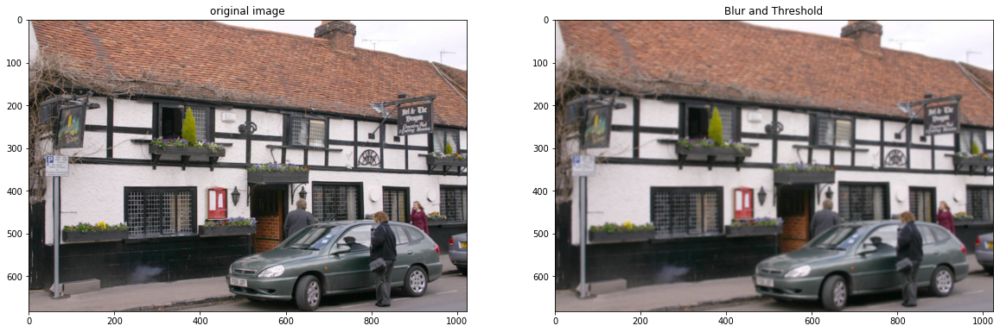

In [8]:
## 일반 이미지
img = cv2.imread(path+'00009e5b390986a0.jpg',cv2.IMREAD_COLOR) 

## 가우시안
dst = cv2.GaussianBlur(img,(9,9),0)
# (0,0)  : ksize를 (0,0)으로 하면 자동설정


plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.title('original image')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.subplot(1, 2, 2)
plt.title('Blur and Threshold')
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

#plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show() 

### 특정 영역에 블러처리

In [9]:
path = '/data/open_dt/korea_lp/OID_plate_5k/Dataset/train/Vehicle registration plate/'
# 00009e5b390986a0.jpg

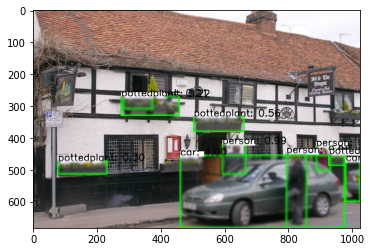

In [10]:
net = cv2.dnn_DetectionModel('yolov4.weights', 'yolov4.cfg')
net.setInputSize(704,704)
net.setInputScale(1.0 / 255)
net.setInputSwapRB(True)

## 일반 이미지
frame = cv2.imread(path+'00009e5b390986a0.jpg',cv2.IMREAD_COLOR) 
    
    
with open("coco.names", "rt") as f:
    names = f.read().rstrip('\n').split('\n')
classes, confidences,boxes = net.detect(frame,confThreshold=0.1, nmsThreshold=0.4)

    
    
if len(classes) > 0:
    for classId,confidence,box in zip(classes.flatten(), confidences.flatten(), boxes):
        label = '%.2f' % confidence
        label = '%s: %s' % (names[classId], label)
        labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5,1)
        left, top, width, height = box
        top = max(top,labelSize[1])
        cv2.rectangle(frame,box,color=(0,255,0),thickness=3)
        cv2.rectangle(frame, (left,top - labelSize[1]), (left+labelSize[0], top+baseLine), (255,255,255), cv2.FILLED)
        cv2.putText(frame,label, (left,top), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,0),thickness=2)
        
        
        roi = frame[top:top+height, left:left+width]   # 관심영역 지정
        roi = cv2.GaussianBlur(roi,(15,15),0)
        frame[top:top+height, left:left+width] = roi   # 원본 이미지에 적용
    
    
plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))    
plt.show() 

In [21]:
import cv2
import time

CONFIDENCE_THRESHOLD = 0.2
NMS_THRESHOLD = 0.4
COLORS = [(0, 255, 255), (255, 255, 0), (0, 255, 0), (255, 0, 0)]

class_names = []
with open("coco.names", "r") as f:
    class_names = [cname.strip() for cname in f.readlines()]

    
path = '/data/open_dt'
vc = cv2.VideoCapture(path+'/sejong_drive.mp4')


net = cv2.dnn.readNet("yolov4.weights", "yolov4.cfg")
#net.setInputSize(704,704)
#net.setInputScale(1.0 / 255)
#net.setInputSwapRB(True)


model = cv2.dnn_DetectionModel(net)
model.setInputParams(size=(416, 416), scale=1/255, swapRB=True)

while cv2.waitKey(1) < 1:
    (grabbed, frame) = vc.read()
    if not grabbed:
        exit()

    start = time.time()
    classes, scores, boxes = model.detect(frame, CONFIDENCE_THRESHOLD, NMS_THRESHOLD)
    end = time.time()

    start_drawing = time.time()
    for (classid, score, box) in zip(classes, scores, boxes):
        color = COLORS[int(classid) % len(COLORS)]
        label = "%s : %f" % (class_names[classid[0]], score)
        cv2.rectangle(frame, box, color, 2)
        cv2.putText(frame, label, (box[0], box[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    end_drawing = time.time()
    
    fps_label = "FPS: %.2f (excluding drawing time of %.2fms)" % (1 / (end - start), (end_drawing - start_drawing) * 1000)
    cv2.putText(frame, fps_label, (0, 25), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2)
    
    
    
vc.release()

KeyboardInterrupt: 